Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Images disponibles dans le dossier :  ['imag9.jpg', 'imag8.jpg', 'imag7.jpg', 'imag4.jpg', 'imag3.png', 'imag11.jpg', 'imag5.jpg', 'imag6.jpg', 'imag10.jpg', 'imag2.png', 'imag1.png']


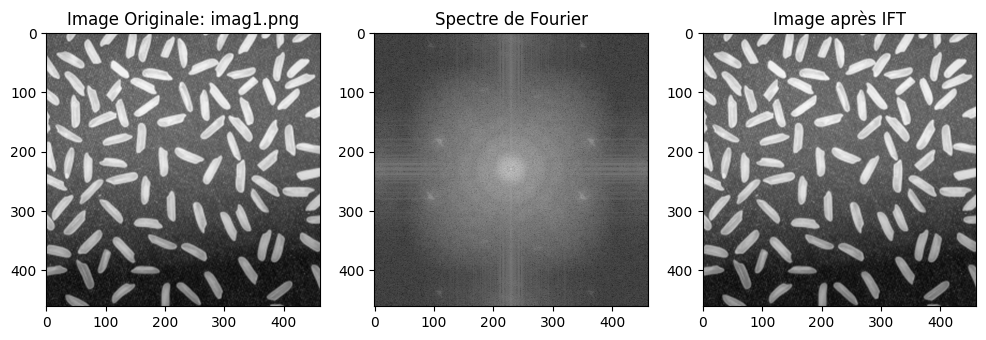

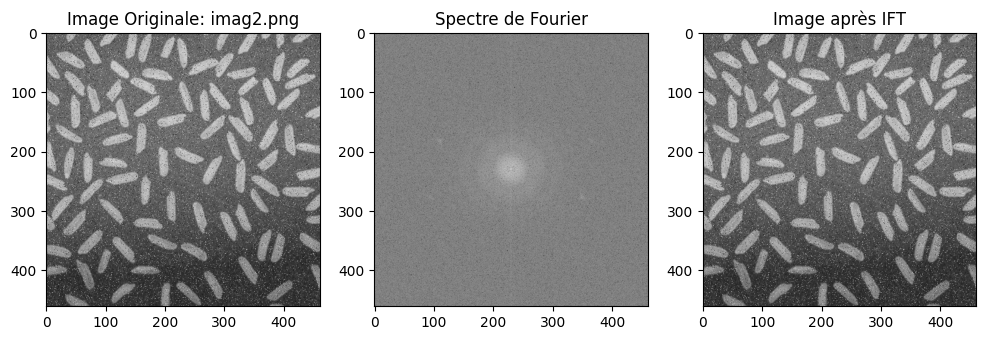

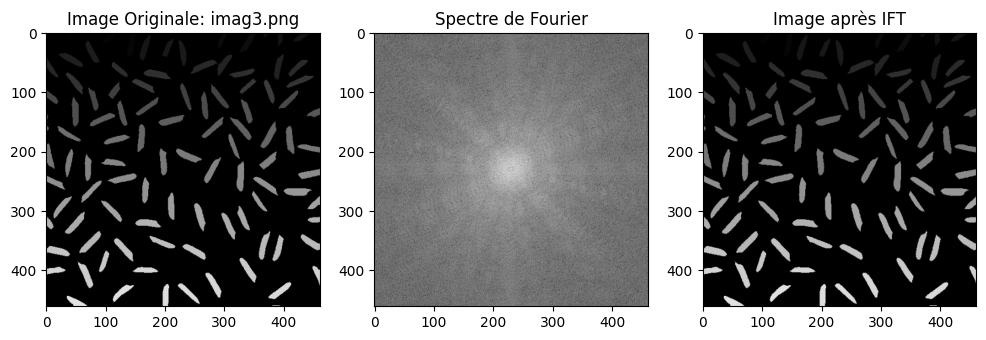

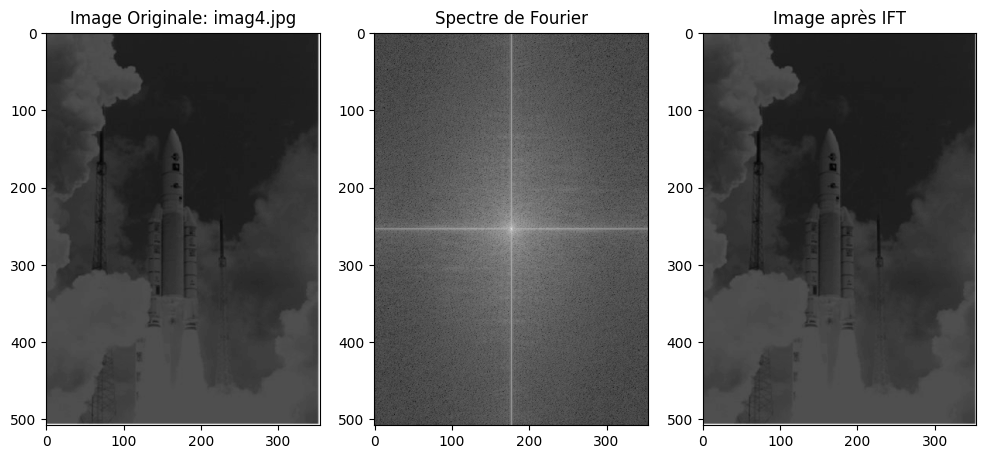

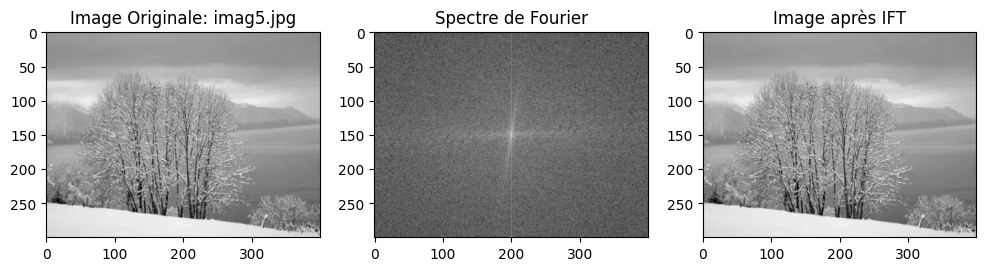

...

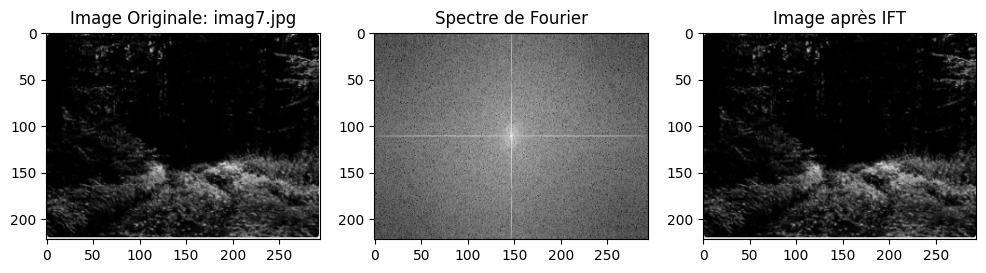

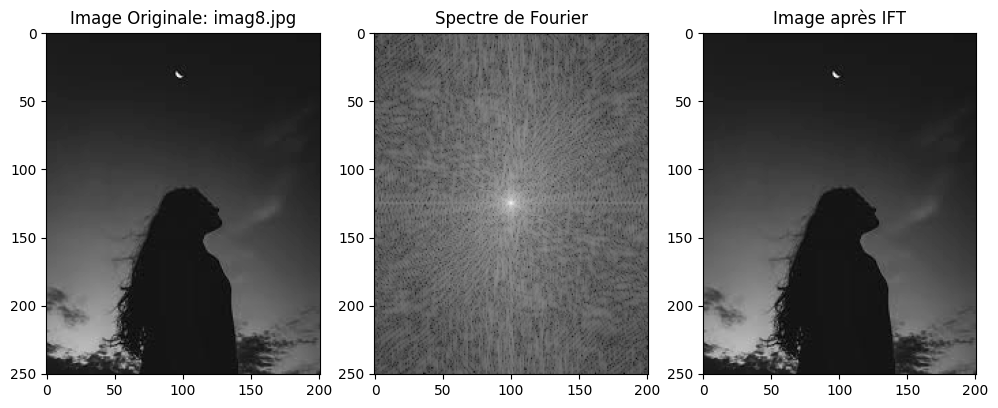

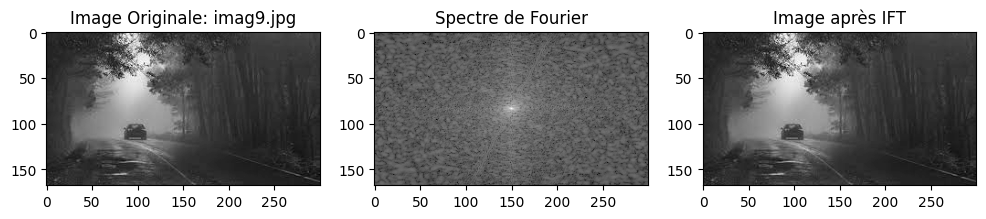

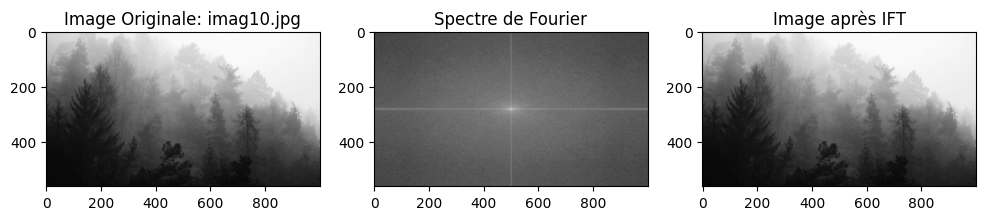

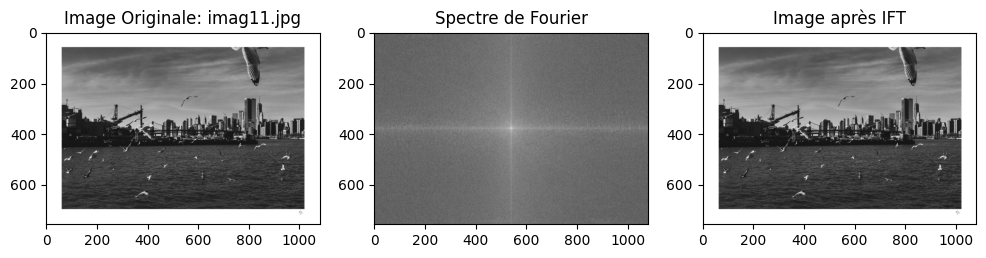

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
from google.colab import drive

# Monter Google Drive
drive.mount('/content/drive')

# Chemin du dossier contenant les images
images_path = "/content/drive/MyDrive/Traitement_image (1)"

# Lister les images dans le dossier pour vérifier les noms de fichiers
print("Images disponibles dans le dossier : ", os.listdir(images_path))

# Liste des images que vous voulez afficher
image_names = ['imag1.png', 'imag2.png', 'imag3.png','imag4.jpg','imag5.jpg','imag6.jpg','imag7.jpg','imag8.jpg','imag9.jpg','imag10.jpg','imag11.jpg']  # Remplacez par les images que vous voulez afficher

# Boucle pour charger, transformer et afficher chaque image
for image_name in image_names:
    image_full_path = os.path.join(images_path, image_name)

    # Charger l'image depuis le chemin correct
    img = cv2.imread(image_full_path, 0)

    # Vérifiez si l'image a été chargée correctement
    if img is None:
        print(f"Erreur: Impossible de charger l'image {image_name}. Veuillez vérifier le chemin d'accès.")
    else:
        # Calculer la transformée de Fourier
        f_transform = np.fft.fft2(img)
        f_transform_shifted = np.fft.fftshift(f_transform)

        # Calculer le spectre de Fourier (magnitude du spectre)
        spectre = 20 * np.log(np.abs(f_transform_shifted))

        # Calculer l'inverse de la transformée de Fourier
        f_ishifted = np.fft.ifftshift(f_transform_shifted)
        img_reconstructed = np.fft.ifft2(f_ishifted)
        img_reconstructed = np.abs(img_reconstructed)

        # Affichage de l'image originale, du spectre de Fourier et de l'image reconstruite
        plt.figure(figsize=(12, 6))

        # Image originale
        plt.subplot(1, 3, 1)
        plt.imshow(img, cmap='gray')
        plt.title(f'Image Originale: {image_name}')

        # Spectre de Fourier
        plt.subplot(1, 3, 2)
        plt.imshow(spectre, cmap='gray')
        plt.title('Spectre de Fourier')

        # Image après la transformation inverse de Fourier
        plt.subplot(1, 3, 3)
        plt.imshow(img_reconstructed, cmap='gray')
        plt.title('Image après IFT')

        # Afficher toutes les images côte à côte
        plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Images disponibles dans le dossier :  ['imag9.jpg', 'imag8.jpg', 'imag7.jpg', 'imag4.jpg', 'imag3.png', 'imag11.jpg', 'imag5.jpg', 'imag6.jpg', 'imag10.jpg', 'imag2.png', 'imag1.png']


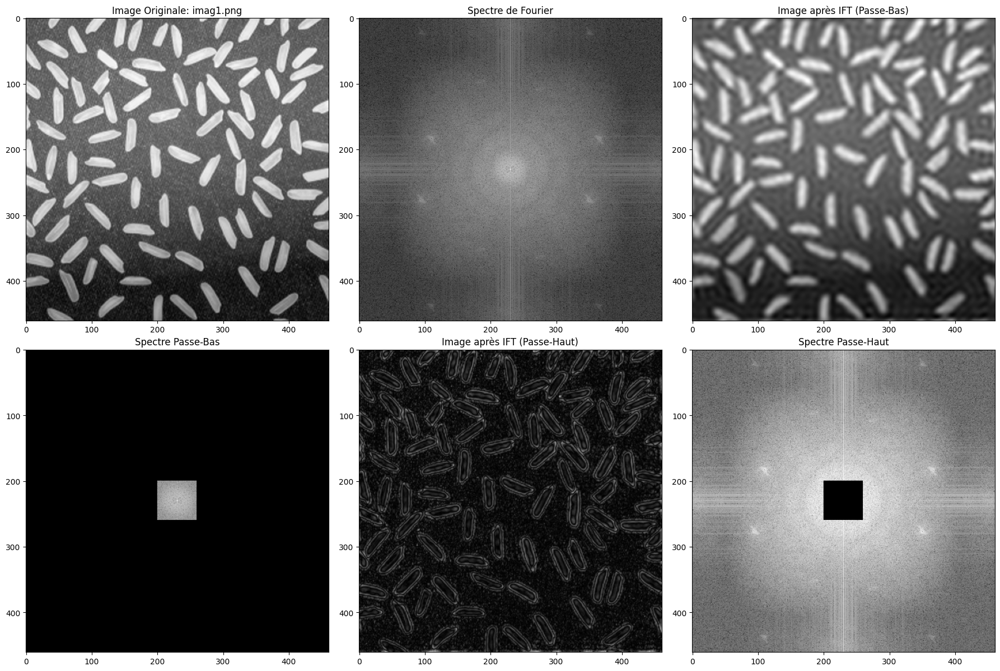

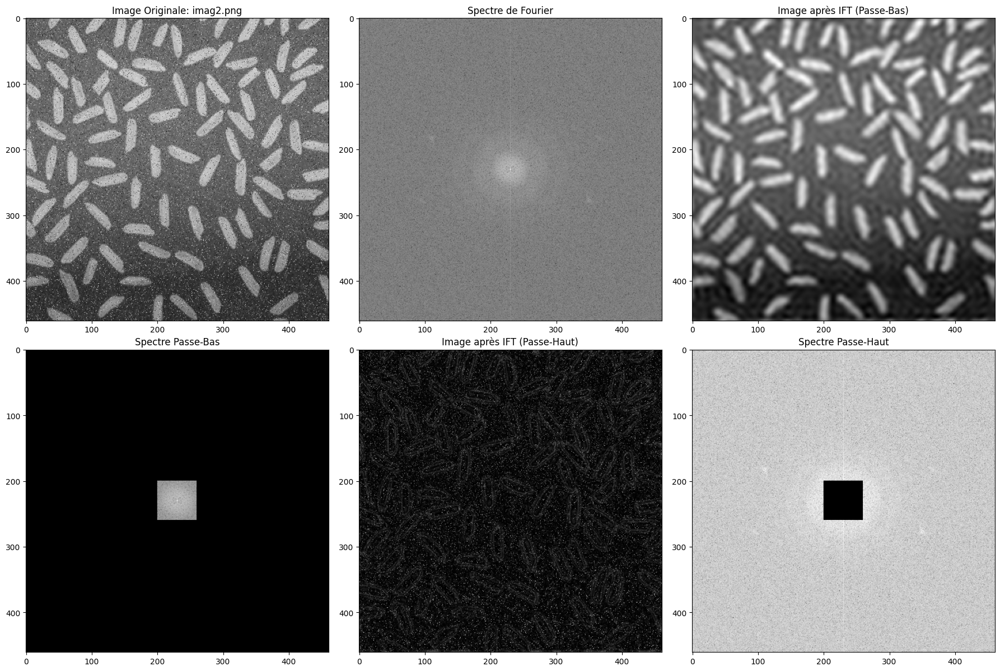

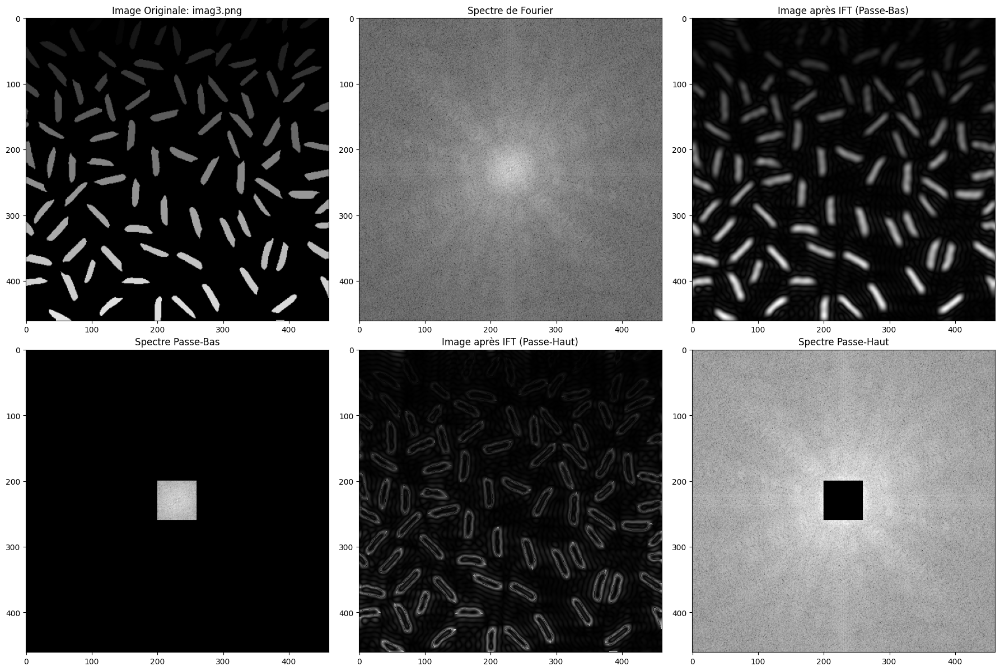

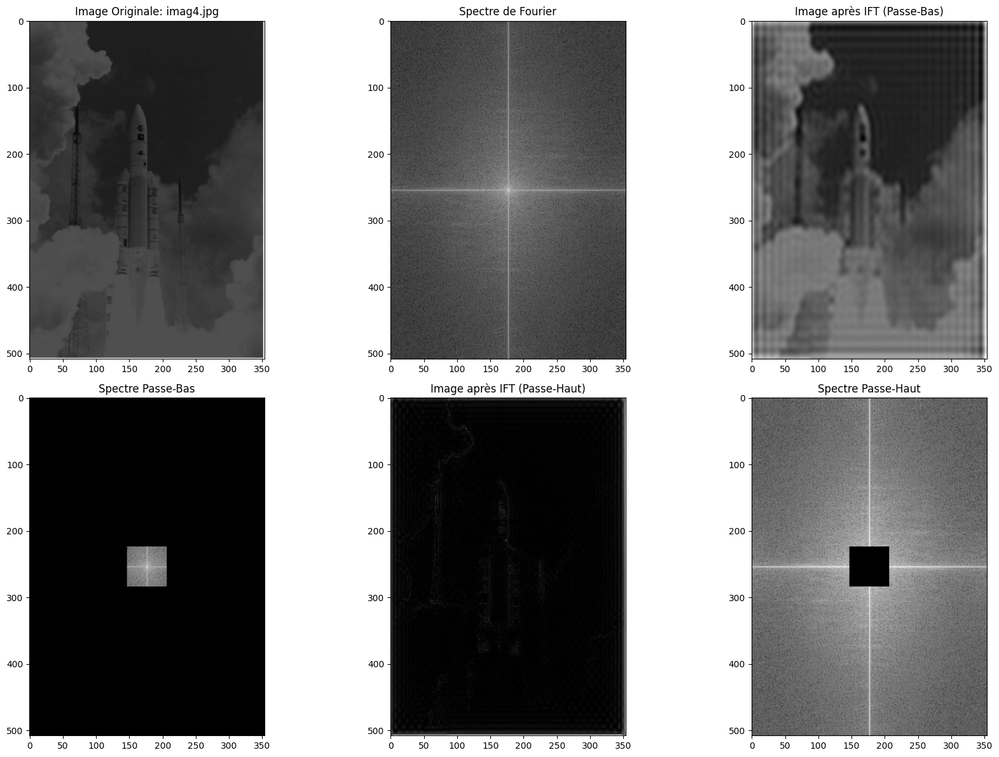

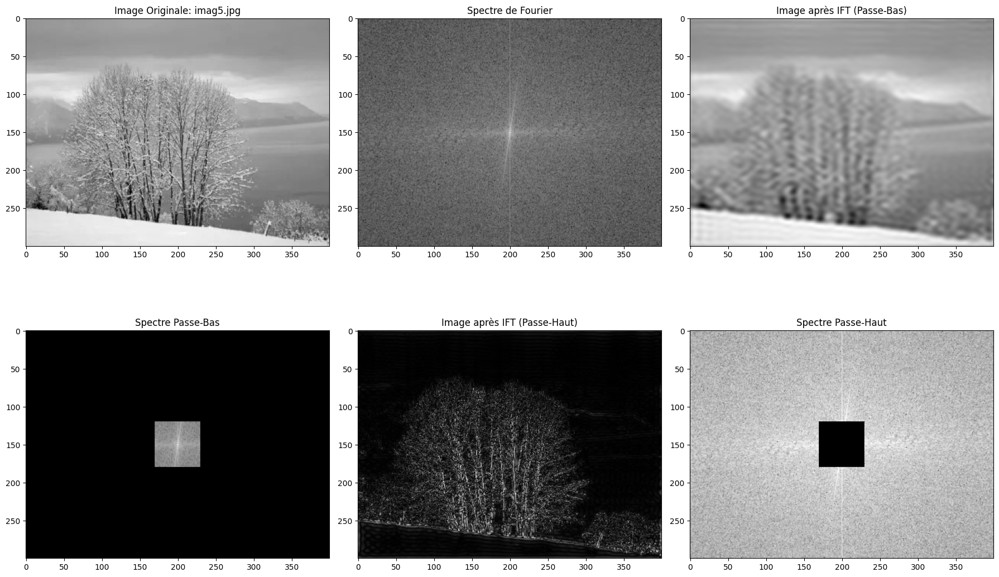

...

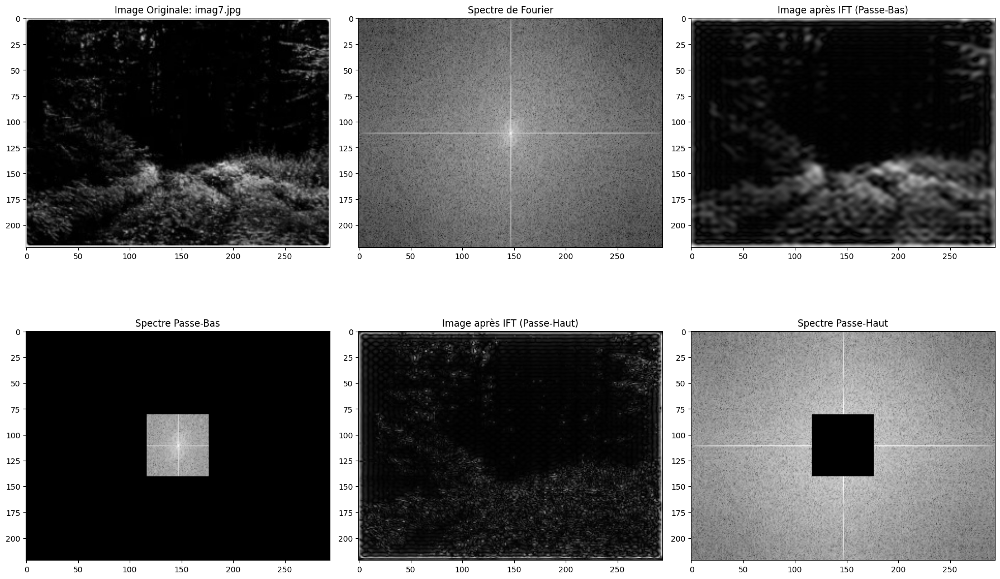

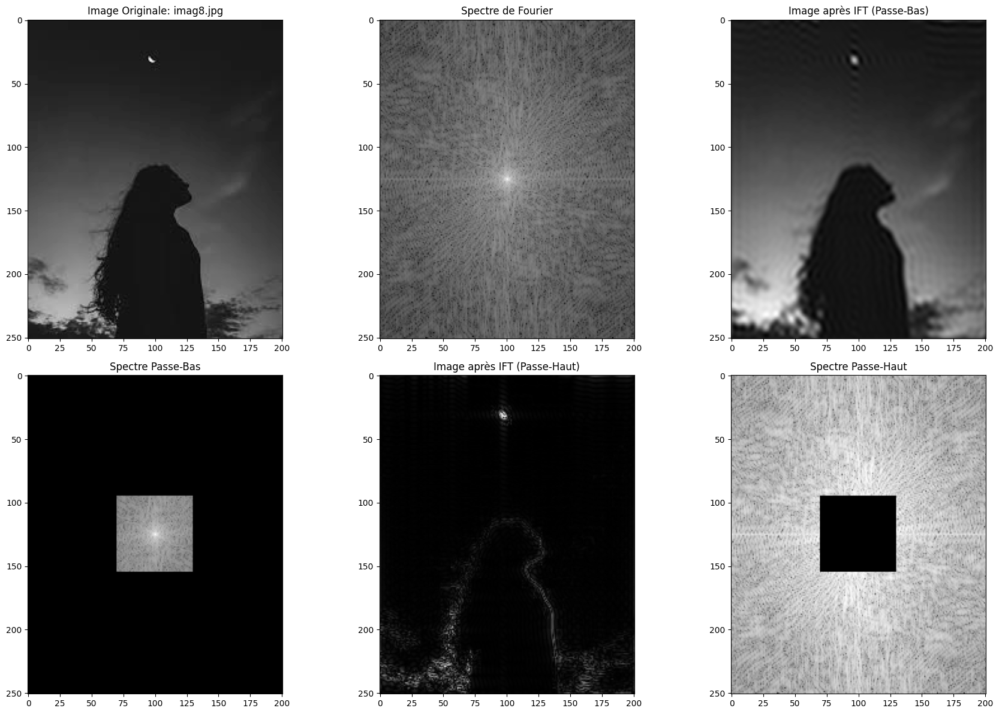

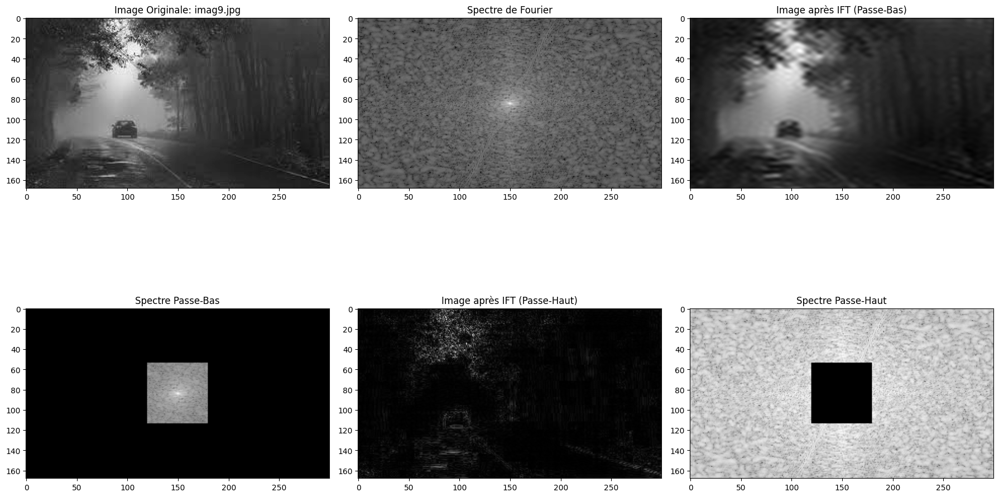

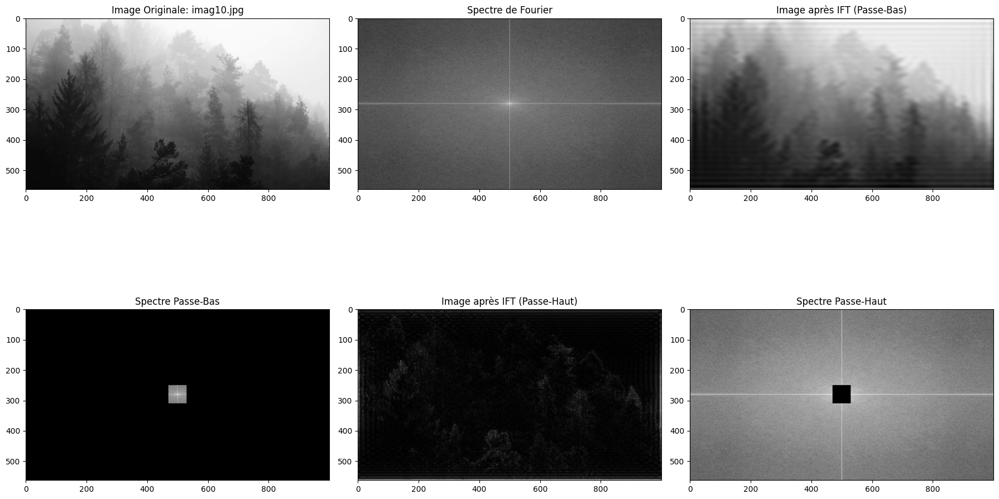

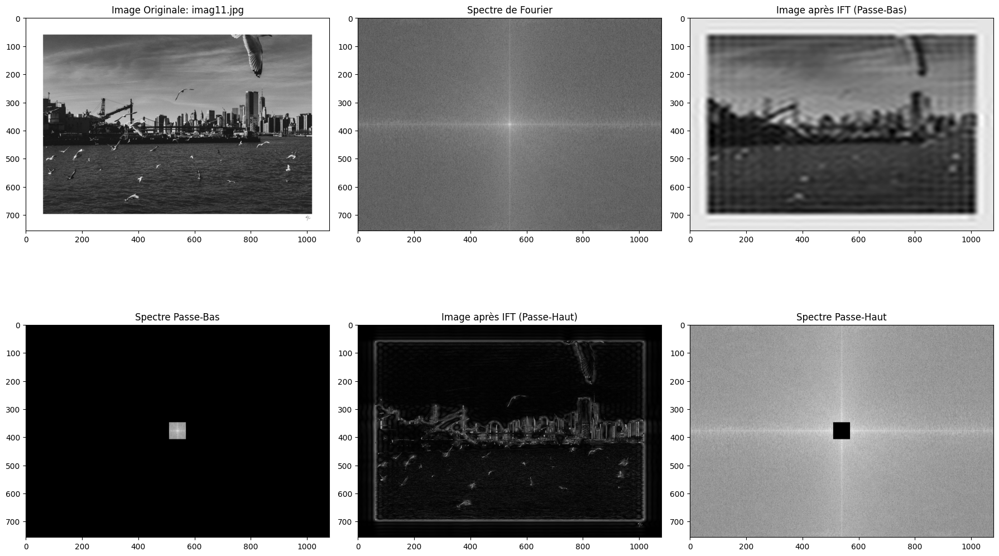

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
from google.colab import drive

# Monter Google Drive
drive.mount('/content/drive')

# Chemin du dossier contenant les images
images_path = "/content/drive/MyDrive/Traitement_image (1)"

# Lister les images dans le dossier pour vérifier les noms de fichiers
print("Images disponibles dans le dossier : ", os.listdir(images_path))

# Liste des images que vous voulez afficher
image_names = ['imag1.png', 'imag2.png', 'imag3.png','imag4.jpg','imag5.jpg','imag6.jpg','imag7.jpg','imag8.jpg','imag9.jpg','imag10.jpg','imag11.jpg']  # Remplacez par les images que vous voulez afficher

# Boucle pour charger, transformer et afficher chaque image
for image_name in image_names:
    image_full_path = os.path.join(images_path, image_name)

    # Charger l'image depuis le chemin correct
    img = cv2.imread(image_full_path, 0)

    # Vérifiez si l'image a été chargée correctement
    if img is None:
        print(f"Erreur: Impossible de charger l'image {image_name}. Veuillez vérifier le chemin d'accès.")
        continue

    # Calculer la transformée de Fourier
    f_transform = np.fft.fft2(img)
    f_transform_shifted = np.fft.fftshift(f_transform)

    # Dimensions de l'image
    rows, cols = img.shape
    crow, ccol = rows // 2, cols // 2

    # Filtre passe-bas
    masque_passe_bas = np.zeros((rows, cols), np.uint8)
    masque_passe_bas[crow-30:crow+30, ccol-30:ccol+30] = 1

    # Filtre passe-haut (inverse du passe-bas)
    masque_passe_haut = 1 - masque_passe_bas

    # Appliquer les filtres
    fshift_passe_bas = f_transform_shifted * masque_passe_bas
    fshift_passe_haut = f_transform_shifted * masque_passe_haut

    # Transformée inverse de Fourier après application des filtres
    f_ishift_passe_bas = np.fft.ifftshift(fshift_passe_bas)
    img_reconstructed_passe_bas = np.fft.ifft2(f_ishift_passe_bas)
    img_reconstructed_passe_bas = np.abs(img_reconstructed_passe_bas)

    f_ishift_passe_haut = np.fft.ifftshift(fshift_passe_haut)
    img_reconstructed_passe_haut = np.fft.ifft2(f_ishift_passe_haut)
    img_reconstructed_passe_haut = np.abs(img_reconstructed_passe_haut)

    # Calculer les spectres après application des filtres
    spectre_bas = 20 * np.log(np.abs(fshift_passe_bas) + 1)  # Ajouter 1 pour éviter le log(0)
    spectre_haut = 20 * np.log(np.abs(fshift_passe_haut) + 1)  # Ajouter 1 pour éviter le log(0)

    # Affichage des images et des résultats
    plt.figure(figsize=(18, 12))

    # Image originale
    plt.subplot(2, 3, 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Image Originale: {image_name}')

    # Spectre de Fourier
    plt.subplot(2, 3, 2)
    plt.imshow(20 * np.log(np.abs(f_transform_shifted) + 1), cmap='gray')
    plt.title('Spectre de Fourier')

    # Image après transformation inverse
    plt.subplot(2, 3, 3)
    plt.imshow(img_reconstructed_passe_bas, cmap='gray')
    plt.title('Image après IFT (Passe-Bas)')

    # Spectre après filtre passe-bas
    plt.subplot(2, 3, 4)
    plt.imshow(spectre_bas, cmap='gray')
    plt.title('Spectre Passe-Bas')

    # Image après transformation inverse avec filtre passe-haut
    plt.subplot(2, 3, 5)
    plt.imshow(img_reconstructed_passe_haut, cmap='gray')
    plt.title('Image après IFT (Passe-Haut)')

    # Spectre après filtre passe-haut
    plt.subplot(2, 3, 6)
    plt.imshow(spectre_haut, cmap='gray')
    plt.title('Spectre Passe-Haut')

    # Afficher toutes les images côte à côte
    plt.tight_layout()
    plt.show()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Images disponibles dans le dossier :  ['imag9.jpg', 'imag8.jpg', 'imag7.jpg', 'imag4.jpg', 'imag3.png', 'imag11.jpg', 'imag5.jpg', 'imag6.jpg', 'imag10.jpg', 'imag2.png', 'imag1.png']


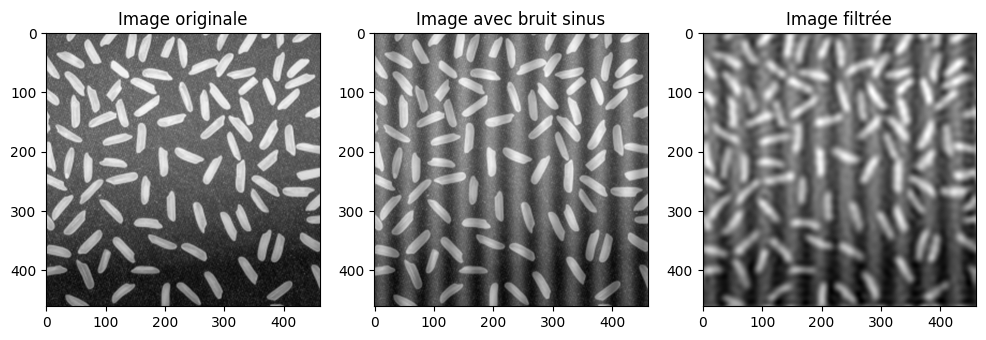

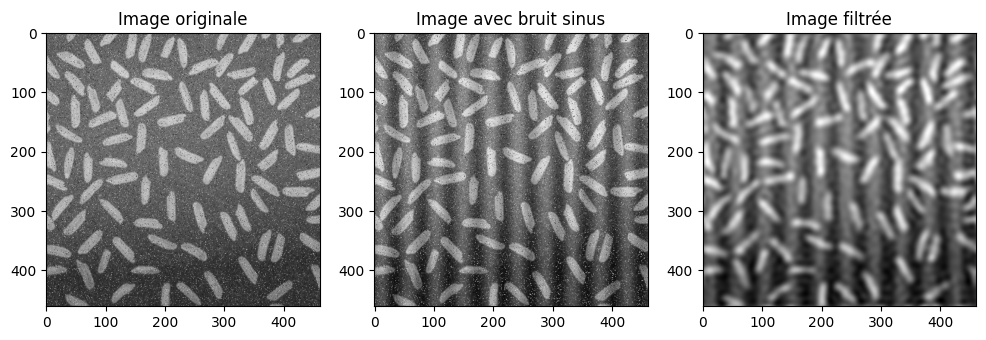

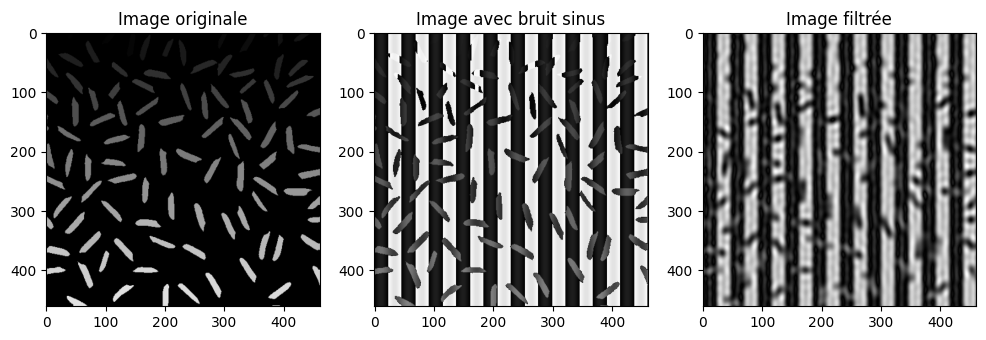

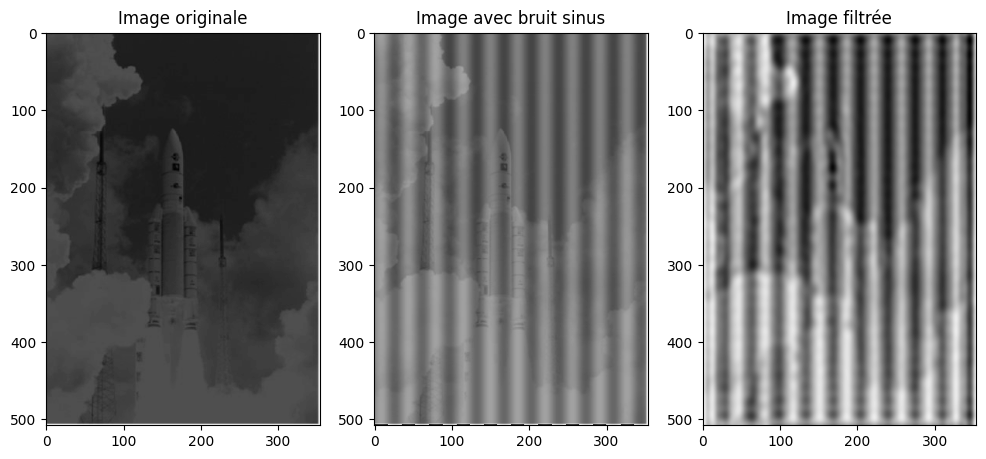

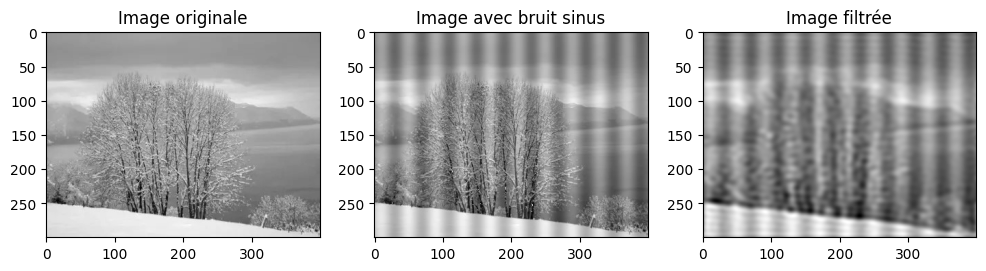

...

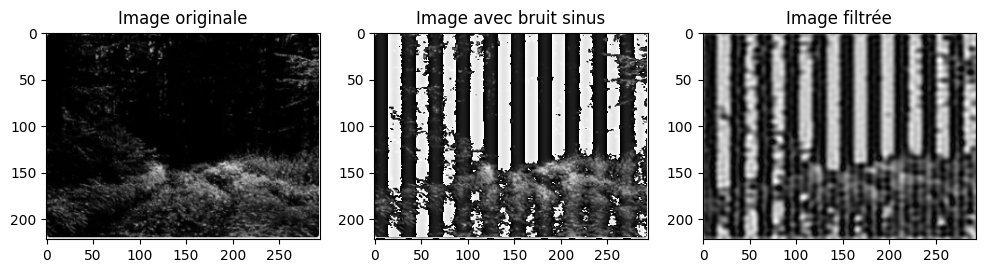

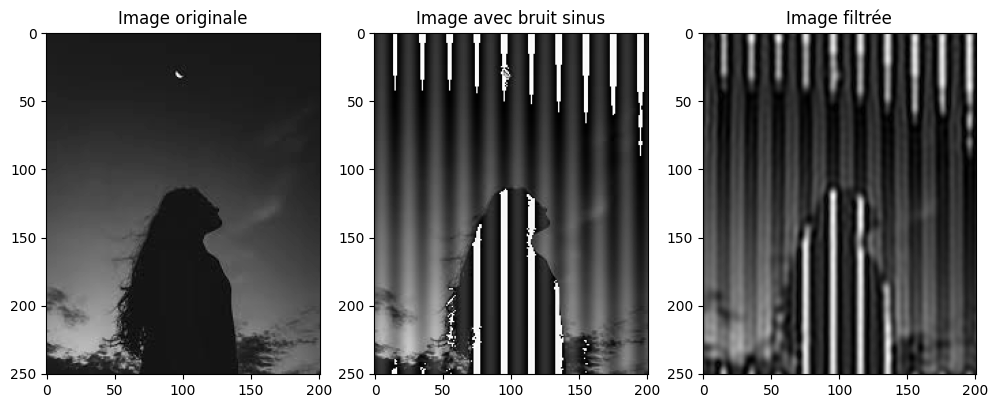

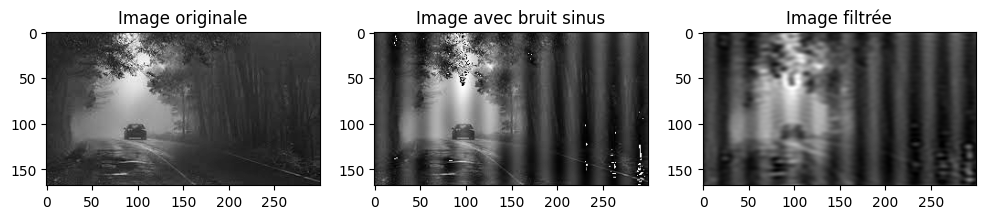

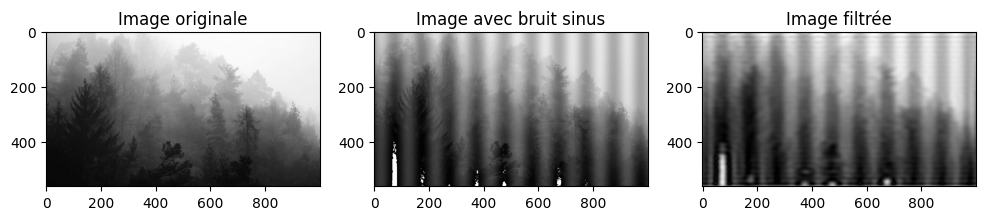

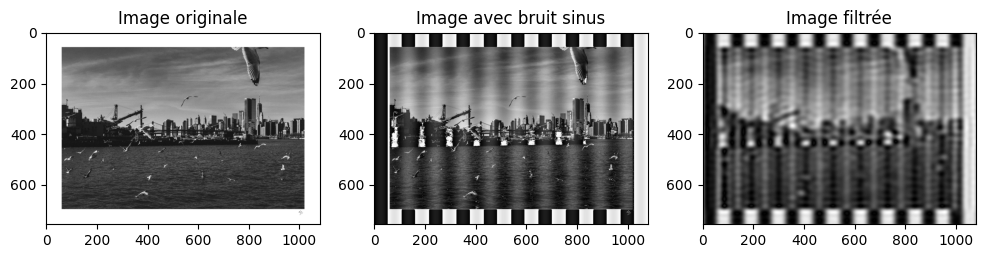

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from google.colab import drive

# Monter Google Drive
drive.mount('/content/drive')

# Chemin du dossier contenant les images
images_path = "/content/drive/MyDrive/Traitement_image (1)"

# Lister les images dans le dossier pour vérifier les noms de fichiers
print("Images disponibles dans le dossier : ", os.listdir(images_path))

# Liste des images que vous voulez afficher
image_names = ['imag1.png', 'imag2.png', 'imag3.png','imag4.jpg','imag5.jpg','imag6.jpg','imag7.jpg','imag8.jpg','imag9.jpg','imag10.jpg','imag11.jpg']  # Remplacez par les images que vous voulez afficher

# Boucle pour charger, transformer et afficher chaque image
for image_name in image_names:
    image_full_path = os.path.join(images_path, image_name)

    # Charger l'image depuis le chemin correct
    img = cv2.imread(image_full_path, 0)

    # Vérifiez si l'image a été chargée correctement
    if img is None:
        print(f"Erreur: Impossible de charger l'image {image_name}. Veuillez vérifier le chemin d'accès.")
        continue

    # Ajouter du bruit sinus
    rows, cols = img.shape
    x = np.linspace(0, 2 * np.pi, cols)
    y = np.sin(10 * x)  # Fréquence du bruit
    noise = np.tile(y, (rows, 1))  # Répéter le bruit pour chaque ligne
    noisy_image = img + (noise * 30).astype(np.uint8)  # Ajuster l'amplitude du bruit

    # Appliquer la transformée de Fourier
    dft = cv2.dft(np.float32(noisy_image), flags=cv2.DFT_COMPLEX_OUTPUT)
    fshift = np.fft.fftshift(dft)

    # Créer un filtre passe-bas
    crow, ccol = rows // 2, cols // 2
    r = 30  # Rayon du filtre
    mask = np.zeros((rows, cols, 2), np.uint8)
    cv2.circle(mask, (ccol, crow), r, (1, 1), thickness=-1)

    # Appliquer le filtre
    fshift_filtered = fshift * mask

    # Transformée de Fourier inverse
    img_back = cv2.idft(np.fft.ifftshift(fshift_filtered))
    img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

    # Afficher les résultats
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 3, 1)
    plt.title('Image originale')
    plt.imshow(img, cmap='gray')
    plt.subplot(1, 3, 2)
    plt.title('Image avec bruit sinus')
    plt.imshow(noisy_image, cmap='gray')
    plt.subplot(1, 3, 3)
    plt.title('Image filtrée')
    plt.imshow(img_back, cmap='gray')
    plt.show()
